# <font color="aqua">Configuración inicial</font>

ctrl+ } comentar y descomentar

In [1]:
import nltk
nltk.download("book")
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import mplcyberpunk

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     C:\Users\Alex\AppData\Roaming

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


## <font color="green">Analizando texto</font>

In [2]:
text1

<Text: Moby Dick by Herman Melville 1851>

In [3]:
# mostrar tokens
text1.tokens[:10]

['[',
 'Moby',
 'Dick',
 'by',
 'Herman',
 'Melville',
 '1851',
 ']',
 'ETYMOLOGY',
 '.']

In [4]:
len(text1)

260819

## <font color="green">Medidas de riqueza léxica de un texto</font>

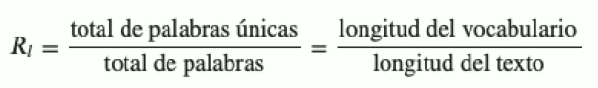

In [5]:
vocabulario = set(text1)
sorted(vocabulario)[:10]

['!', '!"', '!"--', "!'", '!\'"', '!)', '!)"', '!*', '!--', '!--"']

In [6]:
rl = len(vocabulario)/len(text1)
rl

0.07406285585022564

In [7]:
def riqueza_lexica(texto):
    vocabulario = sorted(set(texto))
    return len(vocabulario)/len(texto)
riqueza_lexica(text1)

0.07406285585022564

In [8]:
def porcentaje_palabra(palabra, text):
    return 100*text.count(palabra)/len(text)
porcentaje_palabra("monster", text1)

0.018786974875296663

## <font color="green">Estadisticas del lenguaje</font>

In [9]:
# FRECUENCIA DE APARICION DE LAS PALABRAS
#Metodo ineficiente
# dic = {}
# for word in set(text1):
#     dic[word] =text1.count(word)

# dic

In [10]:
# NLTK
# FRECUECIA DE APARICION DE LAS PALABRAS
frec_dist_words = FreqDist(text1)
frec_dist_words.most_common(20)

[(',', 18713),
 ('the', 13721),
 ('.', 6862),
 ('of', 6536),
 ('and', 6024),
 ('a', 4569),
 ('to', 4542),
 (';', 4072),
 ('in', 3916),
 ('that', 2982),
 ("'", 2684),
 ('-', 2552),
 ('his', 2459),
 ('it', 2209),
 ('I', 2124),
 ('s', 1739),
 ('is', 1695),
 ('he', 1661),
 ('with', 1659),
 ('was', 1632)]

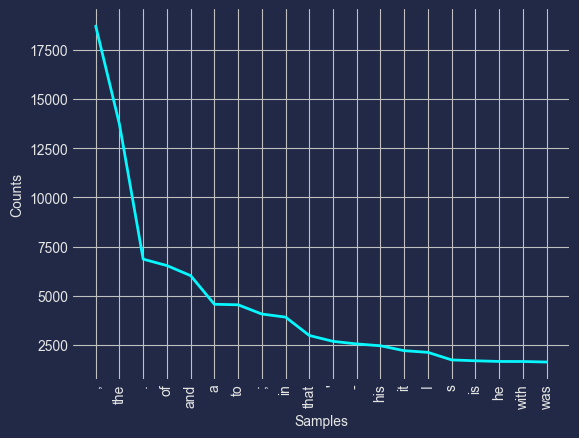

In [11]:
# Graficando la frecuencia de aparicion de las 20 primeras palabras
plt.style.use("cyberpunk")
frec_dist_words.plot(20)
plt.show()

In [12]:
frec_dist_words["monster"]

49

## <font color="green">Distribuciones sobre contenido con filtro fino</font>

In [13]:
long_words = [word for word in text1 if len(word) > 5]
vocabulary_filtered = sorted(set(long_words))
vocabulary_filtered[:10]

['ACCOUNT',
 'ADDITIONAL',
 'ADVANCING',
 'ADVENTURES',
 'AFFGHANISTAN',
 'AFRICA',
 'AGAINST',
 'ALFRED',
 'ALGERINE',
 'AMERICA']

In [14]:
palabras_interesantes = [(palabra, frec_dist_words[palabra]) for palabra in set(text1) if len(palabra)>5 and frec_dist_words[palabra]>10 ]                         
palabras_interesantes

[('person', 28),
 ('remained', 34),
 ('yourself', 26),
 ('object', 39),
 ('swallowed', 13),
 ('people', 42),
 ('dangerous', 13),
 ('character', 14),
 ('invariably', 11),
 ('Lakeman', 24),
 ('receiving', 11),
 ('remarkable', 13),
 ('thousand', 51),
 ('looking', 68),
 ('helmsman', 11),
 ('minutes', 21),
 ('plainly', 39),
 ('lightning', 26),
 ('command', 28),
 ('straight', 46),
 ('pocket', 12),
 ('either', 39),
 ('hammock', 33),
 ('becomes', 12),
 ('encounter', 16),
 ('stranger', 48),
 ('observed', 18),
 ('holding', 34),
 ('Queequeg', 252),
 ('however', 80),
 ('several', 46),
 ('commander', 16),
 ('thunder', 23),
 ('advance', 21),
 ('breath', 18),
 ('sinking', 13),
 ('formed', 22),
 ('pointed', 29),
 ('whether', 76),
 ('heaven', 40),
 ('prairie', 11),
 ('stranded', 12),
 ('double', 16),
 ('fashion', 11),
 ('return', 13),
 ('bowels', 12),
 ('turned', 66),
 ('secure', 12),
 ('speaking', 23),
 ('moving', 13),
 ('myself', 68),
 ('bottom', 52),
 ('circles', 13),
 ('square', 13),
 ('Elijah', 15

In [15]:
dtypes = [("word","S10"),("frequency",int)]
palabras_interesantes = np.array(palabras_interesantes, dtype = dtypes)

In [16]:
palabras_interesantes = np.sort(palabras_interesantes,order="frequency")
palabras_interesantes

array([(b'America',  11), (b'Father',  11), (b'Fleece',  11),
       (b'Guernsey',  11), (b'Heaven',  11), (b'NANTUCKET',  11),
       (b'Perseus',  11), (b'Ramadan',  11), (b'Therefore',  11),
       (b'additional',  11), (b'advanced',  11), (b'appearance',  11),
       (b'baleen',  11), (b'barbaric',  11), (b'beating',  11),
       (b'begins',  11), (b'beholding',  11), (b'belong',  11),
       (b'blackness',  11), (b'blanket',  11), (b'blessed',  11),
       (b'butter',  11), (b'central',  11), (b'clothes',  11),
       (b'coiled',  11), (b'commotion',  11), (b'concluding',  11),
       (b'contact',  11), (b'convenient',  11), (b'covered',  11),
       (b'cursed',  11), (b'demanded',  11), (b'desired',  11),
       (b'direct',  11), (b'element',  11), (b'elevated',  11),
       (b'elsewhere',  11), (b'excellent',  11), (b'experience',  11),
       (b'fashion',  11), (b'fashioned',  11), (b'fastened',  11),
       (b'features',  11), (b'fellows',  11), (b'fierce',  11),
       (b'fif

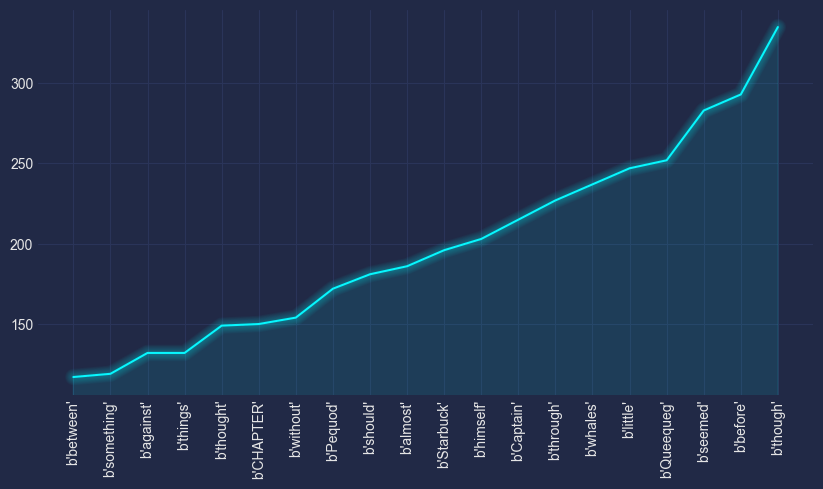

In [17]:
top_words = 20
x = np.arange(len(palabras_interesantes[-top_words:]))
y = [freq[1] for freq in palabras_interesantes[-top_words:]]

plt.figure(figsize=(10,5))
plt.plot(x,y)
plt.xticks(x, [str(freq[0]) for freq in palabras_interesantes[-top_words:]], rotation = "vertical" )
plt.grid(True)
mplcyberpunk.add_glow_effects()
plt.show()

## N-GRAMAS Y COLOCACIONES

In [18]:
import plotly.express as px

### Bi-gramas

* par de palabras consecutivas

In [19]:
md_bigramas=list(bigrams(text1))
md_bigramas

[('[', 'Moby'),
 ('Moby', 'Dick'),
 ('Dick', 'by'),
 ('by', 'Herman'),
 ('Herman', 'Melville'),
 ('Melville', '1851'),
 ('1851', ']'),
 (']', 'ETYMOLOGY'),
 ('ETYMOLOGY', '.'),
 ('.', '('),
 ('(', 'Supplied'),
 ('Supplied', 'by'),
 ('by', 'a'),
 ('a', 'Late'),
 ('Late', 'Consumptive'),
 ('Consumptive', 'Usher'),
 ('Usher', 'to'),
 ('to', 'a'),
 ('a', 'Grammar'),
 ('Grammar', 'School'),
 ('School', ')'),
 (')', 'The'),
 ('The', 'pale'),
 ('pale', 'Usher'),
 ('Usher', '--'),
 ('--', 'threadbare'),
 ('threadbare', 'in'),
 ('in', 'coat'),
 ('coat', ','),
 (',', 'heart'),
 ('heart', ','),
 (',', 'body'),
 ('body', ','),
 (',', 'and'),
 ('and', 'brain'),
 ('brain', ';'),
 (';', 'I'),
 ('I', 'see'),
 ('see', 'him'),
 ('him', 'now'),
 ('now', '.'),
 ('.', 'He'),
 ('He', 'was'),
 ('was', 'ever'),
 ('ever', 'dusting'),
 ('dusting', 'his'),
 ('his', 'old'),
 ('old', 'lexicons'),
 ('lexicons', 'and'),
 ('and', 'grammars'),
 ('grammars', ','),
 (',', 'with'),
 ('with', 'a'),
 ('a', 'queer'),
 ('que

In [20]:
# distribucion de bigramas o frecuencia de los bigramas
fdist = FreqDist(md_bigramas) # calculando la frecuencia
fdist

FreqDist({(',', 'and'): 2607, ('of', 'the'): 1847, ("'", 's'): 1737, ('in', 'the'): 1120, (',', 'the'): 908, (';', 'and'): 853, ('to', 'the'): 712, ('.', 'But'): 596, (',', 'that'): 584, ('.', '"'): 557, ...})

In [21]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

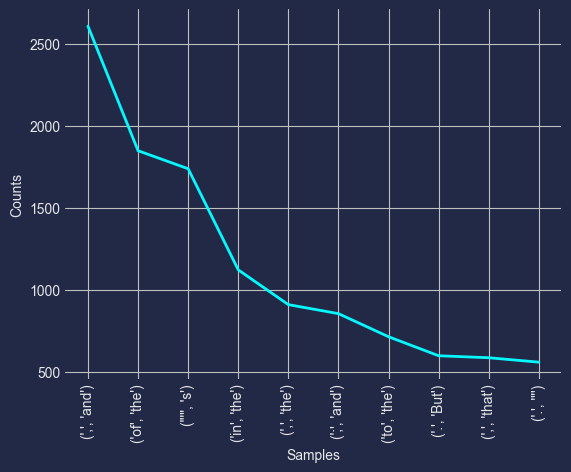

<Axes: xlabel='Samples', ylabel='Counts'>

In [22]:
fdist.plot(10)

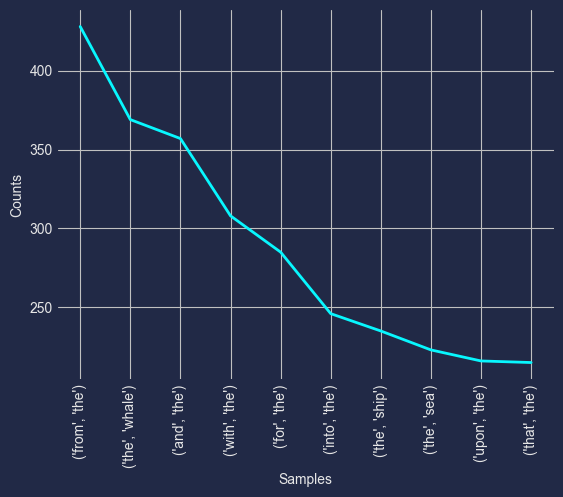

<Axes: xlabel='Samples', ylabel='Counts'>

In [23]:
## Fitrado de bigramas
threshold = 2 # umbral para limitar el tamño de la palabras mayor a 2 caracteres
filtered_bigrams = [bigram for bigram in md_bigramas if len(bigram[0])>threshold and len(bigram[1])>threshold] 
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(10)

In [24]:
# TRIGRAMAS
from nltk.util import ngrams
md_trigrams = list(ngrams(text1,3))
fdist_trigrams = FreqDist(md_trigrams)
fdist_trigrams.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

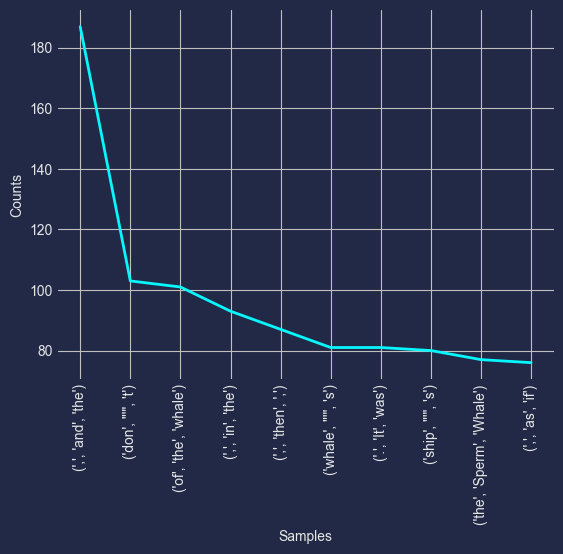

<Axes: xlabel='Samples', ylabel='Counts'>

In [25]:
fdist_trigrams.plot(10)

### TRIGRAMAS

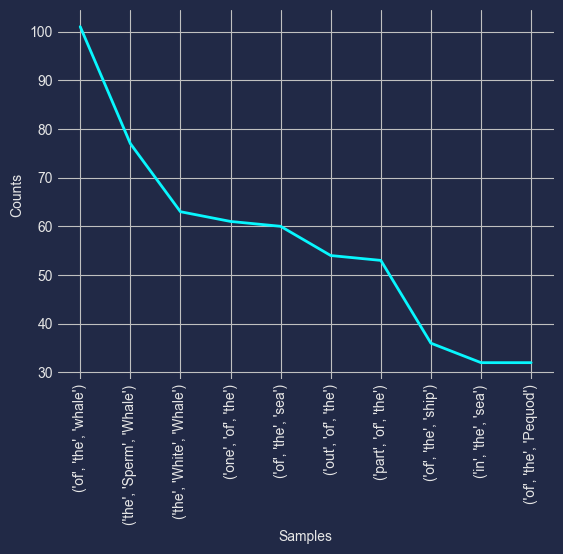

<Axes: xlabel='Samples', ylabel='Counts'>

In [26]:
## Fitrado de trigrams
threshold = 1 # umbral para limitar el tamño de la palabras mayor a 1 caracteres
filtered_trigram = [trigram for trigram in md_trigrams if len(trigram[0])>threshold and len(trigram[1])>threshold and len(trigram[2])>threshold ] 
filtered_dist = FreqDist(filtered_trigram)
filtered_dist.plot(10)

### COLOCACIONES

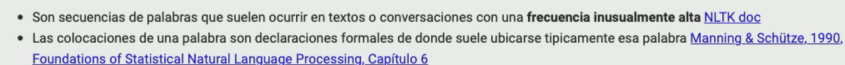

In [27]:
threshold = 2 # umbral para limitar el tamño de la palabras mayor a 2 caracteres
filtered_bigrams = [bigram for bigram in md_bigramas if len(bigram[0])>threshold and len(bigram[1])>threshold] 
filtered_bigram_dist = FreqDist(filtered_bigrams)

In [28]:
df = pd.DataFrame()
df["bi_grams"]= list(set(filtered_bigrams))
df["word_0"]= df["bi_grams"].apply(lambda x: x[0])
df["word_1"]= df["bi_grams"].apply(lambda x: x[1])
df.head()

,bi_grams,word_0,word_1
0,"(rolled, and)",rolled,and
1,"(recollect, having)",recollect,having
2,"(most, notorious)",most,notorious
3,"(wight, Death)",wight,Death
4,"(considerable, quantity)",considerable,quantity


In [29]:
filtered_words = [word for word in text1 if len(word)>threshold] # filtrar palabras superior al umbral
filtered_word_dist =FreqDist(filtered_words) # frecuencia de aparicion
df["bi_gram_freq"] = df["bi_grams"].apply(lambda x: filtered_bigram_dist[x]) # extraer la frecuencia del bigrama
df["word_0_freq"] = df["word_0"].apply(lambda x: filtered_word_dist[x]) # extraer la frecuencia de la palabra sobre todo el corpus
df["word_1_freq"] = df["word_1"].apply(lambda x: filtered_word_dist[x])
df.head()

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(rolled, and)",rolled,and,1,43,6024
1,"(recollect, having)",recollect,having,1,1,62
2,"(most, notorious)",most,notorious,1,277,3
3,"(wight, Death)",wight,Death,1,5,18
4,"(considerable, quantity)",considerable,quantity,1,26,13


### Pointwise Mutual information(PMI)

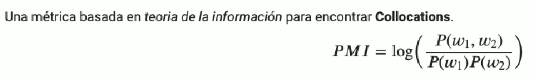

In [30]:
df["PMI"] = df[["bi_gram_freq", "word_0_freq", "word_1_freq"]].apply(lambda x: np.log2(x.values[0]/(x.values[1]*x.values[2])), axis=1) # aplicando la formula o metrica con labda sobre la extraccion de 3 coumnas

Los pares de palabras que son buenos candidatos para ser considerados como colocaciones obtienen valores altos de PMI porque la probabilidad de co-ocurrencia es solamente un poco menor que las probabilidades de ocurrencia de cada una de las palabras. Contrariamente, los pares de palabras cuyas probabilidades de ocurrencia son considerablemente mayores que su probabilidad de co-ocurrencia obtienen valores pequeños de PMI.

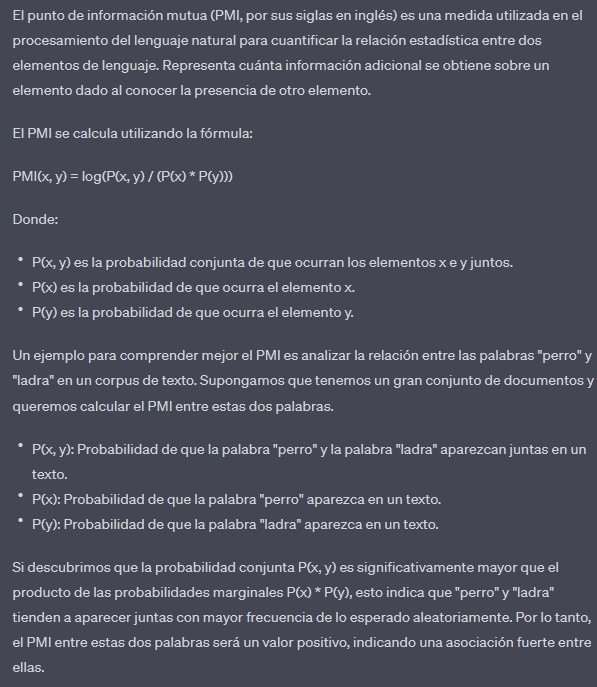

La interpretación del PMI es que cuanto mayor sea su valor, más fuerte es la relación entre los elementos. Un PMI positivo indica una asociación más fuerte, mientras que un PMI negativo indica una asociación más débil o una relación de exclusión mutua.

Es importante tener en cuenta que el PMI no proporciona información sobre la causalidad de la relación o su dirección. Solo mide la dependencia estadística entre los elementos en un corpus de texto.

Ejemplo 1: PMI entre las palabras "sol" y "playa" en un corpus de textos turísticos.

Supongamos que después de analizar el corpus, calculamos el PMI entre las palabras "sol" y "playa" y obtenemos un valor de 1.5. En este caso, un PMI positivo indica una asociación fuerte entre las palabras. La interpretación sería que la presencia de la palabra "sol" aumenta significativamente la probabilidad de que aparezca la palabra "playa" en los textos analizados. Es decir, estas palabras están relacionadas y es común encontrar referencias a la playa cuando se menciona el sol en el contexto turístico.

Ejemplo 2: PMI entre las palabras "gato" y "computadora" en un corpus variado.

Supongamos que en este caso, calculamos el PMI entre las palabras "gato" y "computadora" y obtenemos un valor de -2.0. Un PMI negativo indica una asociación más débil o incluso una relación de exclusión mutua. En este ejemplo, la interpretación sería que la aparición de la palabra "gato" disminuye la probabilidad de que se mencione la palabra "computadora" en los textos analizados. Esto sugiere que estas palabras no están relacionadas o que, en el contexto particular del corpus utilizado, hay una tendencia a mencionar gatos sin hacer referencia a computadoras.

Recuerda que la interpretación del PMI siempre depende del contexto y del corpus específico utilizado para su cálculo.

In [31]:
df # interpretar el PMI

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
0,"(rolled, and)",rolled,and,1,43,6024,-17.982771
1,"(recollect, having)",recollect,having,1,1,62,-5.954196
2,"(most, notorious)",most,notorious,1,277,3,-9.698705
3,"(wight, Death)",wight,Death,1,5,18,-6.491853
4,"(considerable, quantity)",considerable,quantity,1,26,13,-8.400879
...,...,...,...,...,...,...,...
67937,"(The, dancing)",The,dancing,1,612,7,-12.064743
67938,"(anything, important)",anything,important,1,41,19,-9.605480
67939,"(French, soldiers)",French,soldiers,1,18,3,-5.754888
67940,"(tallies, with)",tallies,with,1,1,1659,-10.696098


In [32]:
df.sort_values(by = "PMI", ascending=True)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
12764,"(the, but)",the,but,1,13721,1113,-23.864336
14480,"(the, not)",the,not,1,13721,1103,-23.851315
38358,"(one, the)",one,the,1,889,13721,-23.540138
6163,"(some, the)",some,the,1,578,13721,-22.919024
37147,"(man, the)",man,the,1,508,13721,-22.732783
...,...,...,...,...,...,...,...
11250,"(CAPTAINS, REMAINING)",CAPTAINS,REMAINING,1,1,1,0.000000
56843,"(Clootz, deputation)",Clootz,deputation,1,1,1,0.000000
34821,"(Arkansas, duellist)",Arkansas,duellist,1,1,1,0.000000
12953,"(atrocious, scoundrel)",atrocious,scoundrel,1,1,1,0.000000


### grafico de colocaciones

In [33]:
# creamos una nueva columna
# aplicar logaritmo sobre esta variable para que se mantengan en la mim escala
df["log(bi_gram_freq)"] = df["bi_gram_freq"].apply(lambda x: np.log2(x))
df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(rolled, and)",rolled,and,1,43,6024,-17.982771,0.0
1,"(recollect, having)",recollect,having,1,1,62,-5.954196,0.0
2,"(most, notorious)",most,notorious,1,277,3,-9.698705,0.0
3,"(wight, Death)",wight,Death,1,5,18,-6.491853,0.0
4,"(considerable, quantity)",considerable,quantity,1,26,13,-8.400879,0.0
...,...,...,...,...,...,...,...,...
67937,"(The, dancing)",The,dancing,1,612,7,-12.064743,0.0
67938,"(anything, important)",anything,important,1,41,19,-9.605480,0.0
67939,"(French, soldiers)",French,soldiers,1,18,3,-5.754888,0.0
67940,"(tallies, with)",tallies,with,1,1,1659,-10.696098,0.0


In [34]:
fig = px.scatter(x= df["PMI"].values, y = df["log(bi_gram_freq)"] , 
                 color= df["PMI"]+df["log(bi_gram_freq)"], 
                 hover_name=df["bi_grams"].values, width=600 , height=600 , 
                 labels={'x':'PMI','y':'log(bi gram_freq)'})
fig.show()

* Se observa que el bigrama Moby, Dick presenta un PMI alto y freuencia alta, lo cual quiere decir que es una palabra que guarda mucha informacion, y que el hecho de que aparezca la palabra 'Moby' indica que hay mayor probabilidad que aparezca 'Dick'.

frecuencia alta y PMI bajo : palabras q no aportan sentido ni contenido.        
frecuencia baja y PMI alto : no tienen significaco desde el punto de vista estadístico.

### Medidas pre-construidas en NLTK

In [38]:
# CONTINUAR VIDEO 14
from nltk.collocations import *
bigram_measure = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1) # implementar una clase para encontrar las colocaciones

In [39]:
threshold = 20
finder.apply_freq_filter(threshold) # solo dejar los quedarse con los que son menor a 20
finder.nbest(bigram_measure.pmi, 10) #esas son las 10 colocaiones usando nltk

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

In [41]:
nltk.download('cess_esp')
corpus = nltk.corpus.cess_esp.sents() # lista de listas tokenizado
flatten_corpus = [w for l in corpus for w in l] # obtener una lista plana
flatten_corpus

[nltk_data] Downloading package cess_esp to
[nltk_data]     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


['El',
 'grupo',
 'estatal',
 'Electricité_de_France',
 '-Fpa-',
 'EDF',
 '-Fpt-',
 'anunció',
 'hoy',
 ',',
 'jueves',
 ',',
 'la',
 'compra',
 'del',
 '51_por_ciento',
 'de',
 'la',
 'empresa',
 'mexicana',
 'Electricidad_Águila_de_Altamira',
 '-Fpa-',
 'EAA',
 '-Fpt-',
 ',',
 'creada',
 'por',
 'el',
 'japonés',
 'Mitsubishi_Corporation',
 'para',
 'poner_en_marcha',
 'una',
 'central',
 'de',
 'gas',
 'de',
 '495',
 'megavatios',
 '.',
 'Una',
 'portavoz',
 'de',
 'EDF',
 'explicó',
 'a',
 'EFE',
 'que',
 'el',
 'proyecto',
 'para',
 'la',
 'construcción',
 'de',
 'Altamira_2',
 ',',
 'al',
 'norte',
 'de',
 'Tampico',
 ',',
 'prevé',
 'la',
 'utilización',
 'de',
 'gas',
 'natural',
 'como',
 'combustible',
 'principal',
 'en',
 'una',
 'central',
 'de',
 'ciclo',
 'combinado',
 'que',
 'debe',
 'empezar',
 'a',
 'funcionar',
 'en',
 'mayo_del_2002',
 '.',
 'La',
 'electricidad',
 'producida',
 'pasará',
 'a',
 'la',
 'red',
 'eléctrica',
 'pública',
 'de',
 'México',
 'en_virtud_

In [42]:
finder = BigramCollocationFinder.from_documents(corpus) # calcular las colocaciones
finder.apply_freq_filter(10)
finder.nbest(bigram_measure.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

## RECURSOS LEXICOS

In [43]:
from nltk.corpus import stopwords

In [44]:
# vocabulario
vocab = sorted(set(text1))

In [45]:
# distriuciones de palabras
word_freqDist = FreqDist(text1)

In [46]:
# stopwords
stopwords.words("spanish")

['de',
 'la',
 'que',
 'el',
 'en',
 'y',
 'a',
 'los',
 'del',
 'se',
 'las',
 'por',
 'un',
 'para',
 'con',
 'no',
 'una',
 'su',
 'al',
 'lo',
 'como',
 'más',
 'pero',
 'sus',
 'le',
 'ya',
 'o',
 'este',
 'sí',
 'porque',
 'esta',
 'entre',
 'cuando',
 'muy',
 'sin',
 'sobre',
 'también',
 'me',
 'hasta',
 'hay',
 'donde',
 'quien',
 'desde',
 'todo',
 'nos',
 'durante',
 'todos',
 'uno',
 'les',
 'ni',
 'contra',
 'otros',
 'ese',
 'eso',
 'ante',
 'ellos',
 'e',
 'esto',
 'mí',
 'antes',
 'algunos',
 'qué',
 'unos',
 'yo',
 'otro',
 'otras',
 'otra',
 'él',
 'tanto',
 'esa',
 'estos',
 'mucho',
 'quienes',
 'nada',
 'muchos',
 'cual',
 'poco',
 'ella',
 'estar',
 'estas',
 'algunas',
 'algo',
 'nosotros',
 'mi',
 'mis',
 'tú',
 'te',
 'ti',
 'tu',
 'tus',
 'ellas',
 'nosotras',
 'vosotros',
 'vosotras',
 'os',
 'mío',
 'mía',
 'míos',
 'mías',
 'tuyo',
 'tuya',
 'tuyos',
 'tuyas',
 'suyo',
 'suya',
 'suyos',
 'suyas',
 'nuestro',
 'nuestra',
 'nuestros',
 'nuestras',
 'vuestro'

In [47]:
from nltk.corpus import swadesh

print(swadesh.fileids())

['be', 'bg', 'bs', 'ca', 'cs', 'cu', 'de', 'en', 'es', 'fr', 'hr', 'it', 'la', 'mk', 'nl', 'pl', 'pt', 'ro', 'ru', 'sk', 'sl', 'sr', 'sw', 'uk']


In [49]:
print(swadesh.words("en"))

['I', 'you (singular), thou', 'he', 'we', 'you (plural)', 'they', 'this', 'that', 'here', 'there', 'who', 'what', 'where', 'when', 'how', 'not', 'all', 'many', 'some', 'few', 'other', 'one', 'two', 'three', 'four', 'five', 'big', 'long', 'wide', 'thick', 'heavy', 'small', 'short', 'narrow', 'thin', 'woman', 'man (adult male)', 'man (human being)', 'child', 'wife', 'husband', 'mother', 'father', 'animal', 'fish', 'bird', 'dog', 'louse', 'snake', 'worm', 'tree', 'forest', 'stick', 'fruit', 'seed', 'leaf', 'root', 'bark (from tree)', 'flower', 'grass', 'rope', 'skin', 'meat', 'blood', 'bone', 'fat (noun)', 'egg', 'horn', 'tail', 'feather', 'hair', 'head', 'ear', 'eye', 'nose', 'mouth', 'tooth', 'tongue', 'fingernail', 'foot', 'leg', 'knee', 'hand', 'wing', 'belly', 'guts', 'neck', 'back', 'breast', 'heart', 'liver', 'drink', 'eat', 'bite', 'suck', 'spit', 'vomit', 'blow', 'breathe', 'laugh', 'see', 'hear', 'know (a fact)', 'think', 'smell', 'fear', 'sleep', 'live', 'die', 'kill', 'fight',

In [53]:
en2es = swadesh.entries(['en','es']) # idioma original -> idioma objetivo
print(en2es)

[('I', 'yo'), ('you (singular), thou', 'tú, usted'), ('he', 'él'), ('we', 'nosotros'), ('you (plural)', 'vosotros, ustedes'), ('they', 'ellos, ellas'), ('this', 'este'), ('that', 'ese, aquel'), ('here', 'aquí, acá'), ('there', 'ahí, allí, allá'), ('who', 'quien'), ('what', 'que'), ('where', 'donde'), ('when', 'cuando'), ('how', 'como'), ('not', 'no'), ('all', 'todo'), ('many', 'muchos'), ('some', 'algunos, unos'), ('few', 'poco'), ('other', 'otro'), ('one', 'uno'), ('two', 'dos'), ('three', 'tres'), ('four', 'cuatro'), ('five', 'cinco'), ('big', 'grande'), ('long', 'largo'), ('wide', 'ancho'), ('thick', 'gordo'), ('heavy', 'pesado'), ('small', 'pequeño'), ('short', 'corto'), ('narrow', 'estrecho, angosto'), ('thin', 'delgado, flaco'), ('woman', 'mujer'), ('man (adult male)', 'hombre'), ('man (human being)', 'hombre'), ('child', 'niño'), ('wife', 'esposa, mujer'), ('husband', 'esposo, marido'), ('mother', 'madre'), ('father', 'padre'), ('animal', 'animal'), ('fish', 'pez, pescado'), ('b

In [60]:
translate = dict(en2es) # traducir palabra
translate['play']

'jugar'

## importar texto

In [61]:
import nltk
nltk.download("punkt")
nltk.download("stopwords")
from nltk import word_tokenize
from urllib import request

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alex\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## procesar teto plno desde la web

In [65]:
url = "https://en.wikipedia.org/wiki/Transformer_(machine_learning_model)"
res = request.urlopen(url)
raw = res.read().decode("utf-8")

In [66]:
raw

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>Transformer (machine learning model) - Wikipedia</title>\n<script>document.documentElement.className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled";(function(){var cookie=document.cookie.match

In [67]:
len(raw)

342692

In [70]:
tokens = word_tokenize(raw)
print(tokens)

['<', '!', 'DOCTYPE', 'html', '>', '<', 'html', 'class=', "''", 'client-nojs', 'vector-feature-language-in-header-enabled', 'vector-feature-language-in-main-page-header-disabled', 'vector-feature-sticky-header-disabled', 'vector-feature-page-tools-pinned-disabled', 'vector-feature-toc-pinned-enabled', 'vector-feature-main-menu-pinned-disabled', 'vector-feature-limited-width-enabled', 'vector-feature-limited-width-content-enabled', 'vector-feature-zebra-design-disabled', "''", 'lang=', "''", 'en', "''", 'dir=', "''", 'ltr', "''", '>', '<', 'head', '>', '<', 'meta', 'charset=', "''", 'UTF-8', "''", '>', '<', 'title', '>', 'Transformer', '(', 'machine', 'learning', 'model', ')', '-', 'Wikipedia', '<', '/title', '>', '<', 'script', '>', 'document.documentElement.className=', "''", 'client-js', 'vector-feature-language-in-header-enabled', 'vector-feature-language-in-main-page-header-disabled', 'vector-feature-sticky-header-disabled', 'vector-feature-page-tools-pinned-disabled', 'vector-feat

In [71]:
text = nltk.Text(tokens)
text.collocations()

span class=; mrow class=; annotation encoding=; mstyle displaystyle=;
img src=; external text; mwe-math-mathml-inline mwe-math-mathml-a11y;
math xmlns=; padding:0 0.25em; navbox-list-with-group navbox-list;
navbox-list navbox-odd; link rel=; div class=; .mw-parser-output
.hlist; div style=; sup id=; Edit section; navbox-list navbox-even;
neural network; div id=


## procesar html

In [72]:
import requests
from bs4 import BeautifulSoup
import re
from nltk.tokenize import RegexpTokenizer

In [74]:
url = "https://en.wikipedia.org/wiki/Transformer_(machine_learning_model)"
res = requests.get(url)


In [76]:
html = res.text

In [80]:
soup = BeautifulSoup(html, 'xml')
print(soup)

<?xml version="1.0" encoding="utf-8"?>
<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled" dir="ltr" lang="en">
<head>
<meta charset="UTF-8">
<title>Transformer (machine learning model) - Wikipedia</title>
<script>document.documentElement.className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled";(function()